                            acc_x     acc_y     acc_z   gyr_x   gyr_y   gyr_z  \
epoch (ms)                                                                      
2019-01-11 15:08:05.200  0.013500  0.977000 -0.071000 -1.8904  2.4392  0.9388   
2019-01-11 15:08:05.400 -0.001500  0.970500 -0.079500 -1.6826 -0.8904  2.1708   
2019-01-11 15:08:05.600  0.001333  0.971667 -0.064333  2.5608 -0.2560 -1.4146   
2019-01-11 15:08:05.800 -0.024000  0.957000 -0.073500  8.0610 -4.5244 -2.0730   
2019-01-11 15:08:06.000 -0.028000  0.957667 -0.115000  2.4390 -1.5486 -3.6098   
...                           ...       ...       ...     ...     ...     ...   
2019-01-20 17:33:27.000 -0.048000 -1.041500 -0.076500  1.4146 -5.6218  0.2926   
2019-01-20 17:33:27.200 -0.037000 -1.030333 -0.053333 -2.7684 -0.5854  2.2440   
2019-01-20 17:33:27.400 -0.060000 -1.031000 -0.082000  2.8416 -5.1342 -0.1220   
2019-01-20 17:33:27.600 -0.038667 -1.025667 -0.044667 -0.2318  0.2562  1.1220   
2019-01-20 17:33:27.800 -0.0

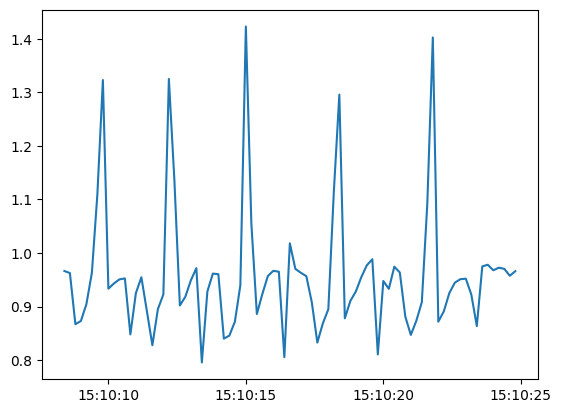

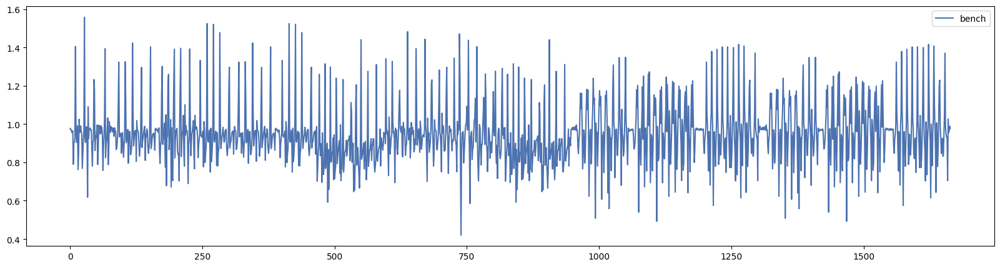

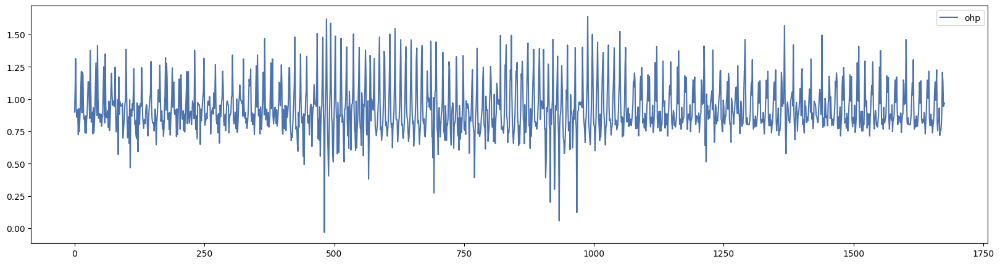

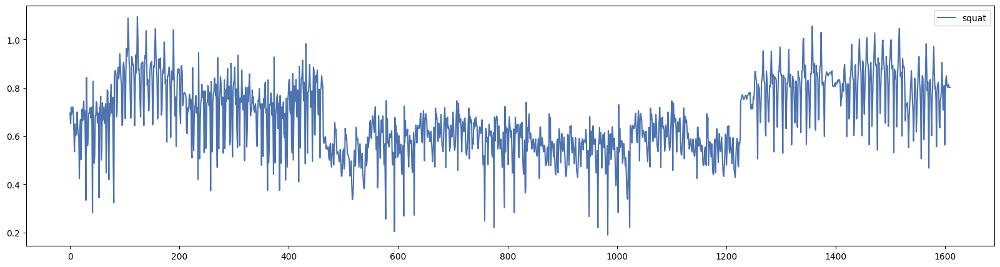

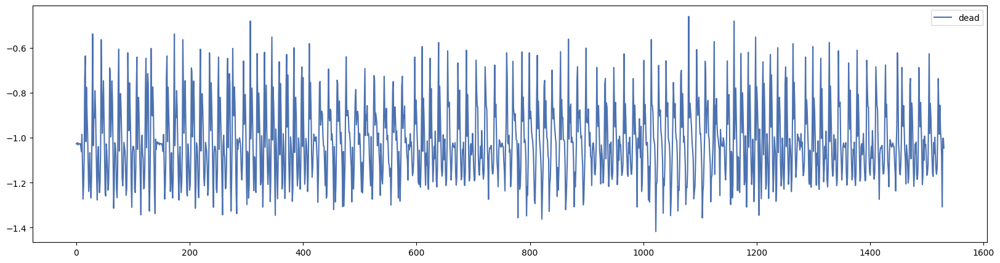

...

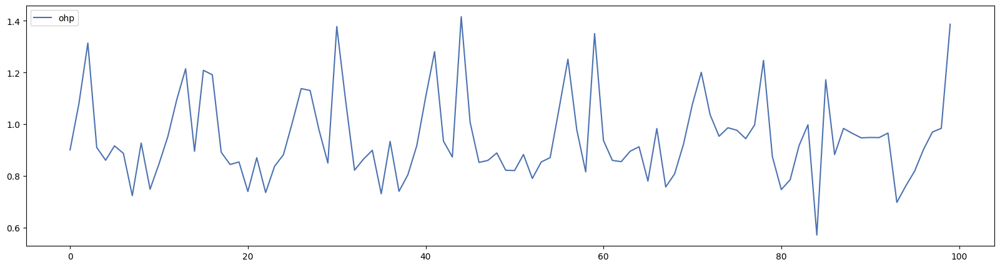

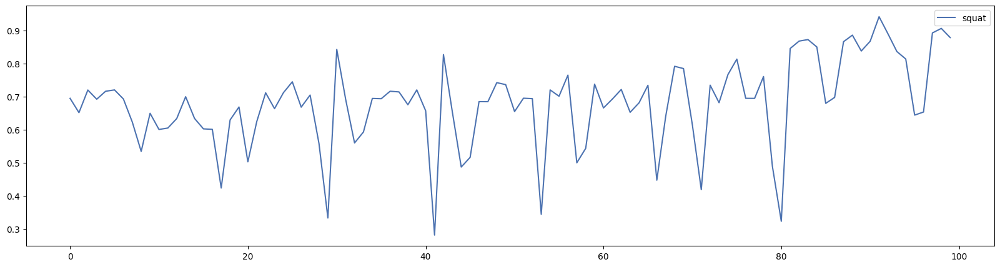

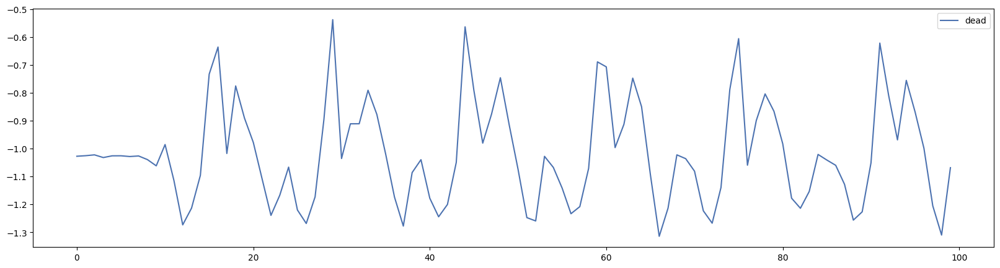

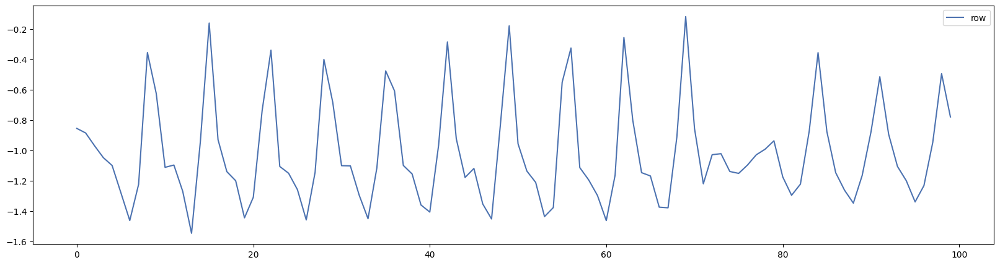

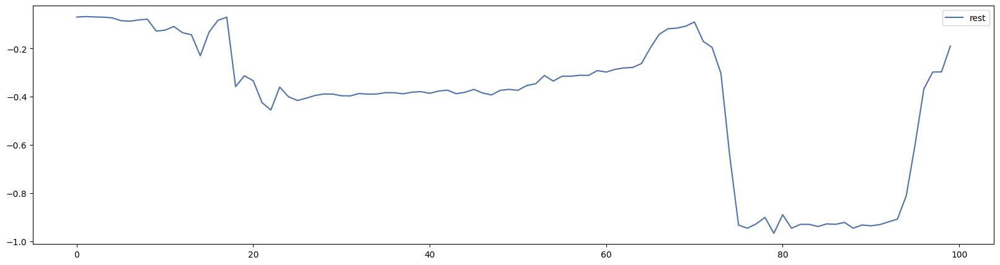

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------

df = pd.read_pickle('../../data/interim/01_data_processed.pkl')
print(df)
# --------------------------------------------------------------
# Plot single columns
# --------------------------------------------------------------

set_df = df[df['set'] == 1]
print(set_df)
plt.plot(set_df['acc_y'])
plt.show()

# --------------------------------------------------------------
# Plot all exercises
# --------------------------------------------------------------

mpl.style.use("seaborn-v0_8-deep") # type: ignore
mpl.rcParams['figure.figsize'] = (20, 5)
mpl.rcParams['figure.dpi'] = 100 

for label in df['label'].unique():
    subset = df[df['label'] == label]
    fig, ax = plt.subplots()
    plt.plot(subset['acc_y'].reset_index(drop=True), label = label)
    plt.legend()
    plt.show()


# now if we want for the smaller time duration 
for label in df['label'].unique():
    subset = df[df['label'] == label]
    fig, ax = plt.subplots()
    plt.plot(subset[:100]['acc_y'].reset_index(drop=True), label = label)
    plt.legend()
    plt.show()

                  epoch (ms)     acc_x     acc_y     acc_z    gyr_x   gyr_y  \
0    2019-01-11 16:05:44.600  0.135333  0.694667  0.735333   2.5366 -0.6220   
1    2019-01-15 19:04:15.400  0.356000  0.486000  0.941667  -9.3780 -2.3292   
2    2019-01-15 19:04:15.600  0.322500  0.434000  0.834000   5.8416 -4.0976   
3    2019-01-15 19:04:15.800  0.332667  0.433667  0.833667   3.2074 -3.4878   
4    2019-01-15 19:04:16.000  0.346500  0.486000  0.856000  14.8782  2.8780   
...                      ...       ...       ...       ...      ...     ...   
1605 2019-01-16 19:14:09.000 -0.024333  0.546000  0.865333 -11.7072  2.0242   
1606 2019-01-16 19:14:08.800 -0.017500  0.573500  0.865500  -9.3414 -0.9512   
1607 2019-01-16 19:14:08.600 -0.024667  0.592333  0.773333 -12.6832 -5.9634   
1608 2019-01-16 19:14:10.600  0.024333  0.554667  0.909333  22.1096 -2.9514   
1609 2019-01-16 19:14:23.200  0.010500  0.564000  0.785000   5.0246 -1.2196   

        gyr_z participtant  label category  set  
0

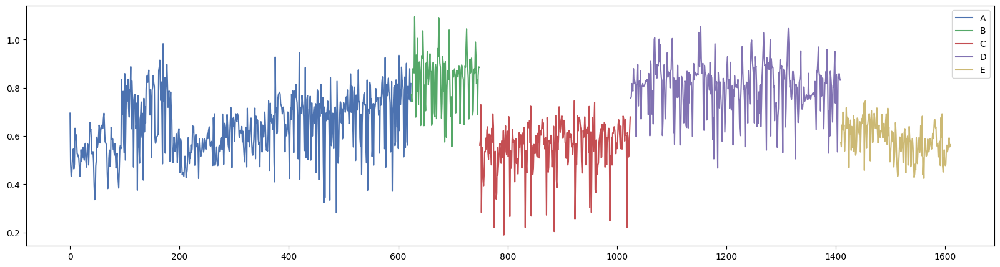

                 epoch (ms)     acc_x     acc_y     acc_z   gyr_x   gyr_y  \
0   2019-01-11 16:05:44.600  0.135333  0.694667  0.735333  2.5366 -0.6220   
1   2019-01-11 16:05:44.800  0.097500  0.651500  0.658000  2.0854  0.0366   
2   2019-01-11 16:05:45.000  0.148667  0.719667  0.694333 -0.0364  1.2562   
3   2019-01-11 16:05:45.200  0.138000  0.692000  0.632000  5.9878 -4.5734   
4   2019-01-11 16:05:45.400  0.131667  0.716000  0.658000 -4.1586 -2.9636   
..                      ...       ...       ...       ...     ...     ...   
619 2019-01-15 19:14:22.600  0.022333  0.482667  0.656000 -8.0976  5.9026   
620 2019-01-15 19:14:22.800  0.028500  0.472500  0.657500 -5.4024  1.6340   
621 2019-01-15 19:14:23.000  0.012000  0.574667  0.839667  6.3904 -1.0854   
622 2019-01-15 19:14:23.200  0.010500  0.564000  0.785000  5.0246 -1.2196   
623 2019-01-15 19:14:23.400  0.015000  0.588000  0.826000  1.5850  1.1585   

      gyr_z participtant  label category  set  
0    1.6098            A  s

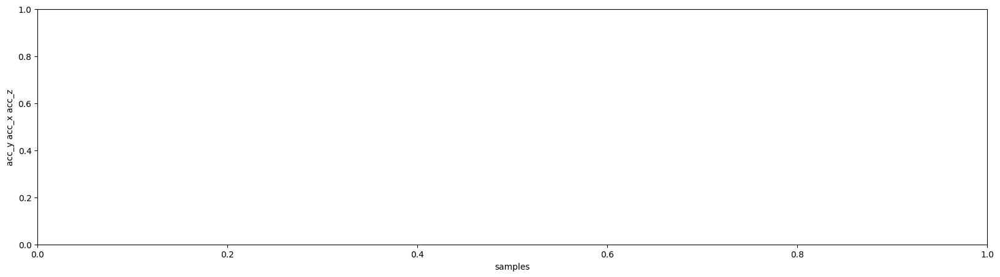

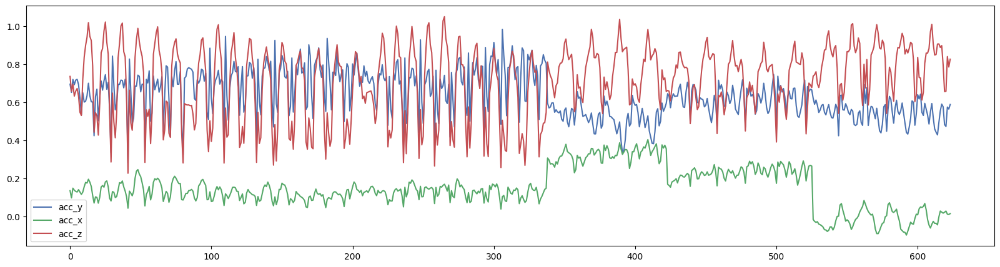

['bench' 'ohp' 'squat' 'dead' 'row' 'rest']
['B' 'A' 'E' 'C' 'D']


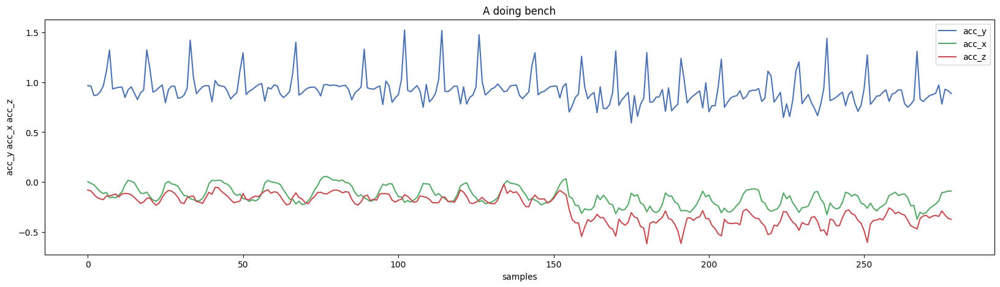

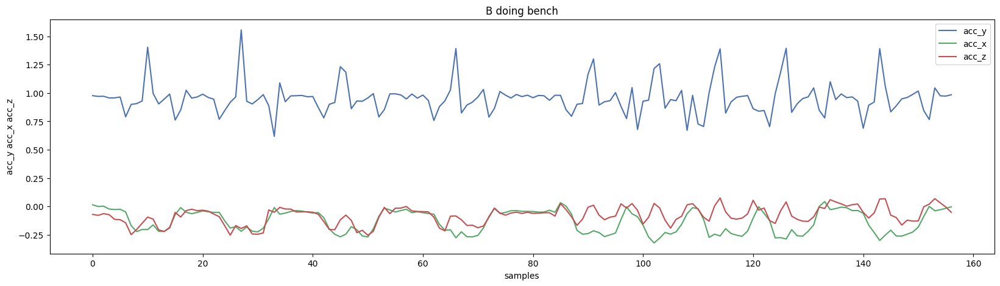

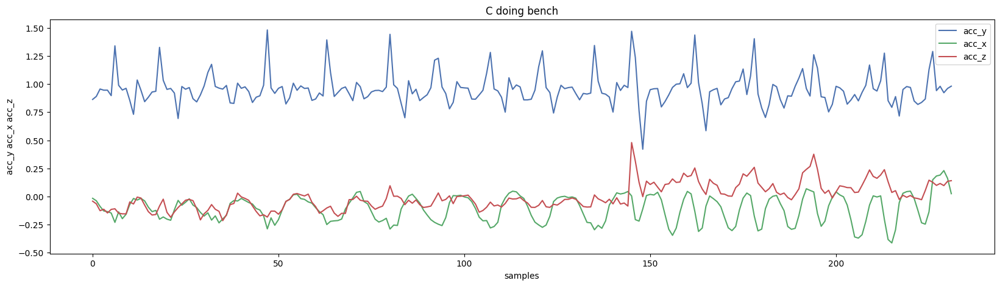

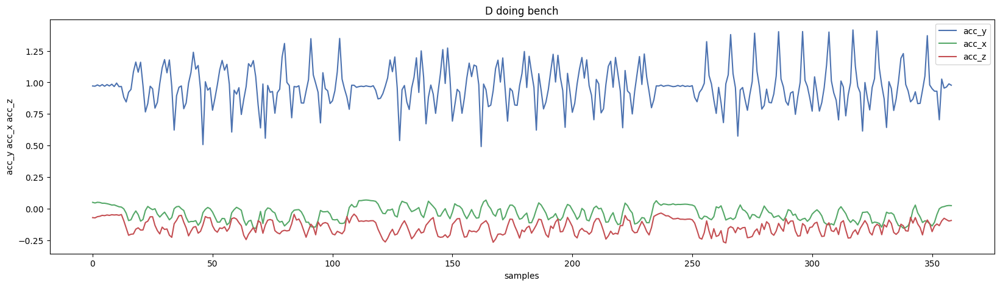

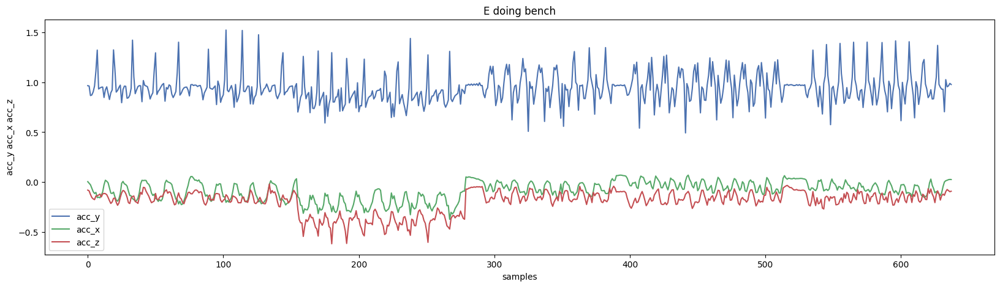

...

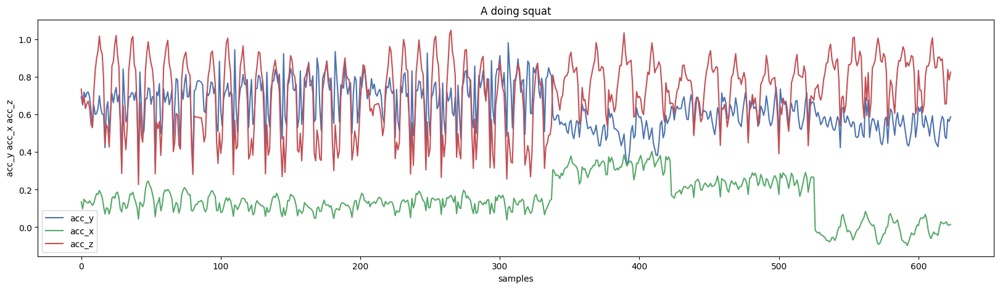

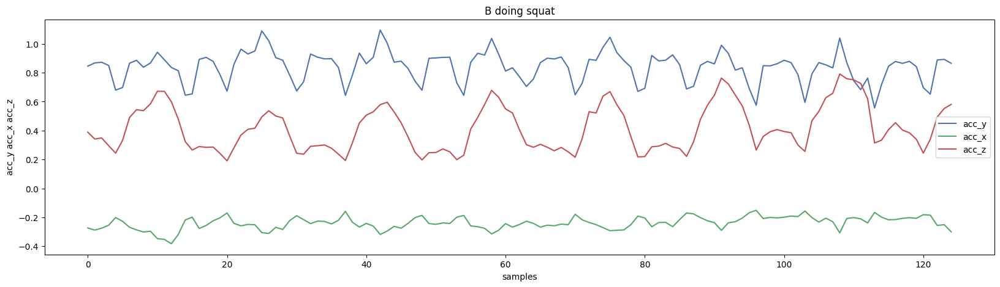

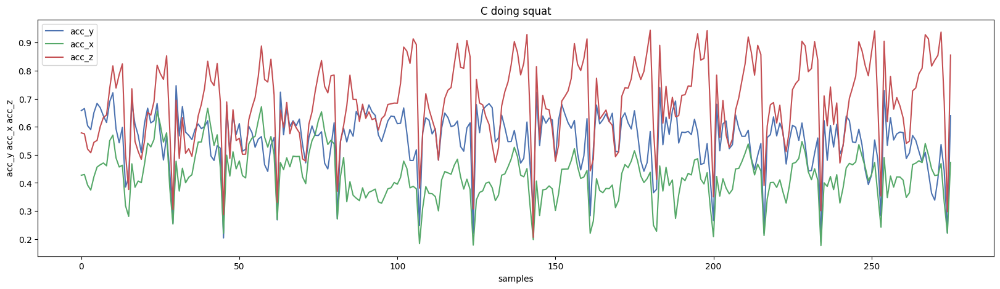

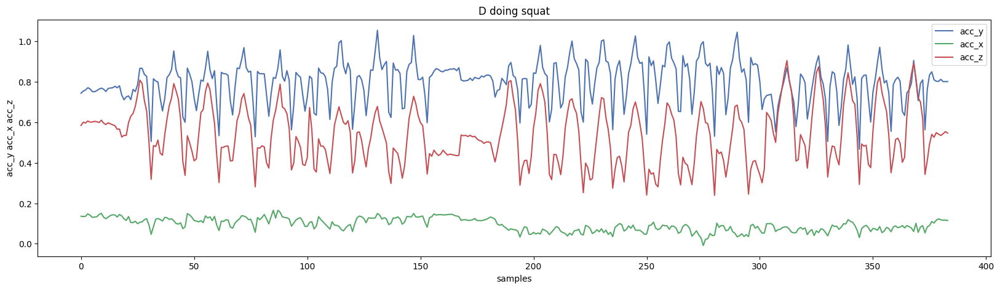

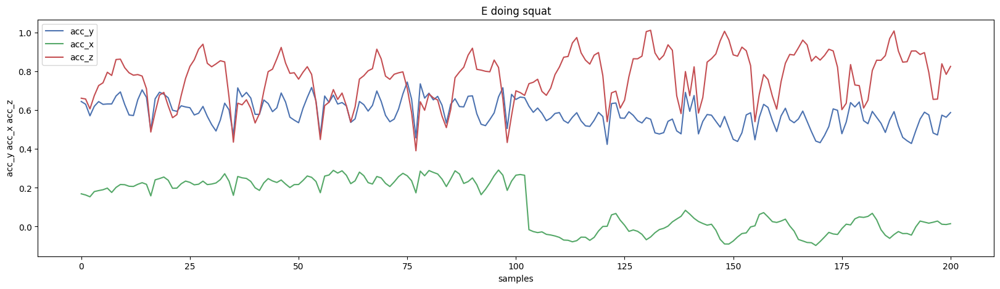

In [5]:
participtant_df = df.query("label == 'squat'").sort_values('participtant').reset_index()
print(participtant_df)

fig, ax = plt.subplots()
participtant_df.groupby(['participtant'])['acc_y'].plot()
plt.legend()
plt.show()

# --------------------------------------------------------------
# Plot multiple axis
# --------------------------------------------------------------

label = 'squat'
participtant = 'A'
all_axis_data_frame = df.query(f"label == '{label}'").query(f"participtant == '{participtant}'").reset_index()
print(all_axis_data_frame)

fig, ax = plt.subplots()
all_axis_data_frame[['acc_y', 'acc_x', 'acc_z']].plot()
ax.set_xlabel('samples')
ax.set_ylabel('acc_y acc_x acc_z')
plt.legend()
plt.show()

# --------------------------------------------------------------
# Create a loop to plot all combinations per sensor
# --------------------------------------------------------------

labels = df['label'].unique()
print(labels)
labels = sorted(labels)
participtants = df['participtant'].unique()
print(participtants)
participtants = sorted(participtants)

for label in labels :
    for participtant in participtants:

        all_axis_df = (
            df.query(f"label == '{label}'").
            query(f"participtant == '{participtant}'").
            reset_index()
        )

        if(len(all_axis_df) > 0):

            fig, ax = plt.subplots()
            all_axis_df[['acc_y', 'acc_x', 'acc_z']].plot(ax = ax)
            ax.set_xlabel('samples')
            ax.set_ylabel('acc_y acc_x acc_z')
            plt.title(f"{participtant} doing {label}")
            plt.legend()
            plt.show()
        

Text(0.5, 0, 'samples')

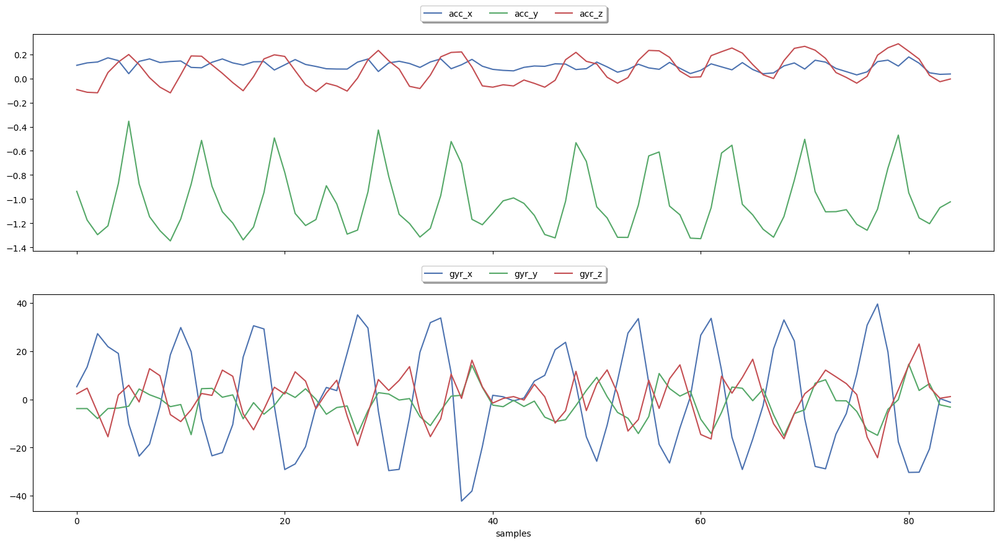

In [7]:
label = 'row'
participtant = 'A'
combined_plot_df = (
    df.query(f"label == '{label}'")
    .query(f"participtant == '{participtant}'")
    .reset_index(drop = True)
)

fig, ax = plt.subplots(nrows = 2, sharex = True, figsize = (20, 10))
combined_plot_df[["acc_x", "acc_y", "acc_z"]].plot(ax = ax[0])
combined_plot_df[['gyr_x', 'gyr_y', 'gyr_z']].plot(ax = ax[1])

ax[0].legend(
    loc = "upper center", bbox_to_anchor = (0.5, 1.15), ncol= 3, fancybox = True, shadow = True
)
ax[1].legend(
    loc = "upper center", bbox_to_anchor = (0.5, 1.15), ncol= 3, fancybox = True, shadow = True
)
ax[1].set_xlabel('samples')

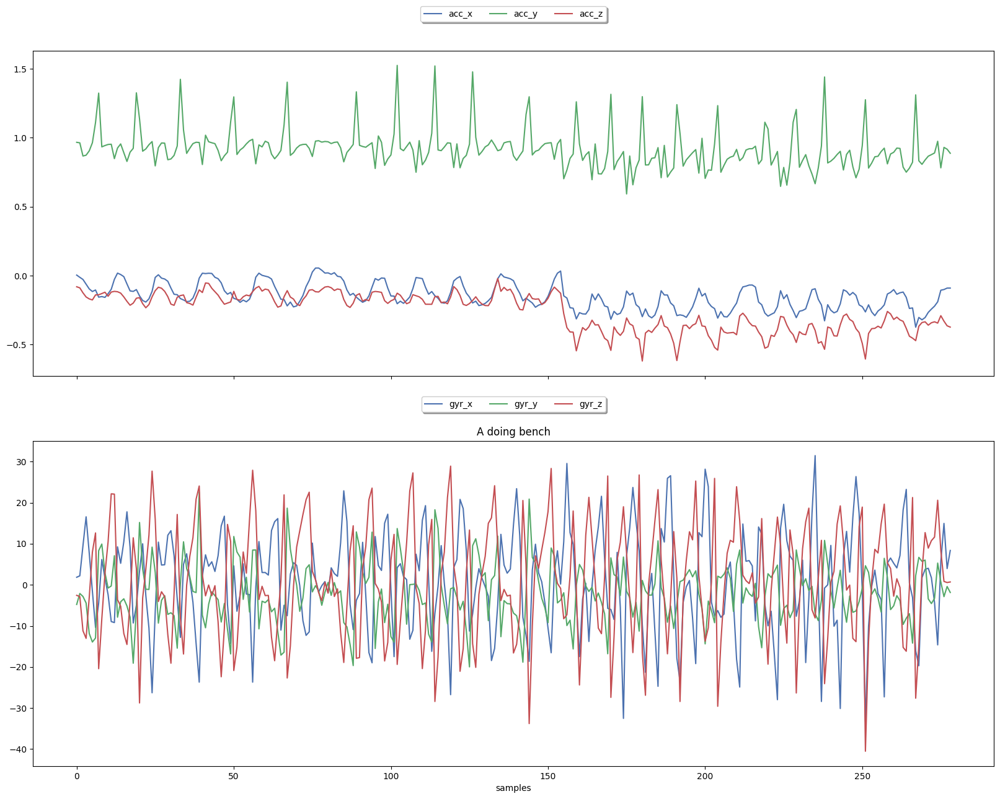

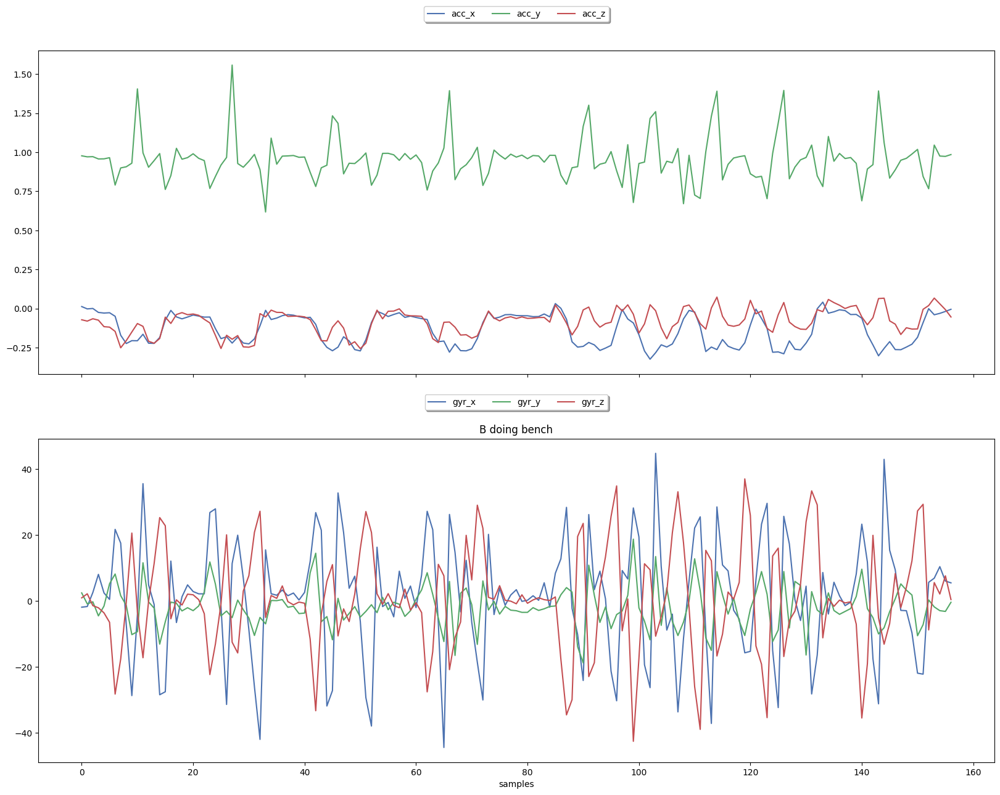

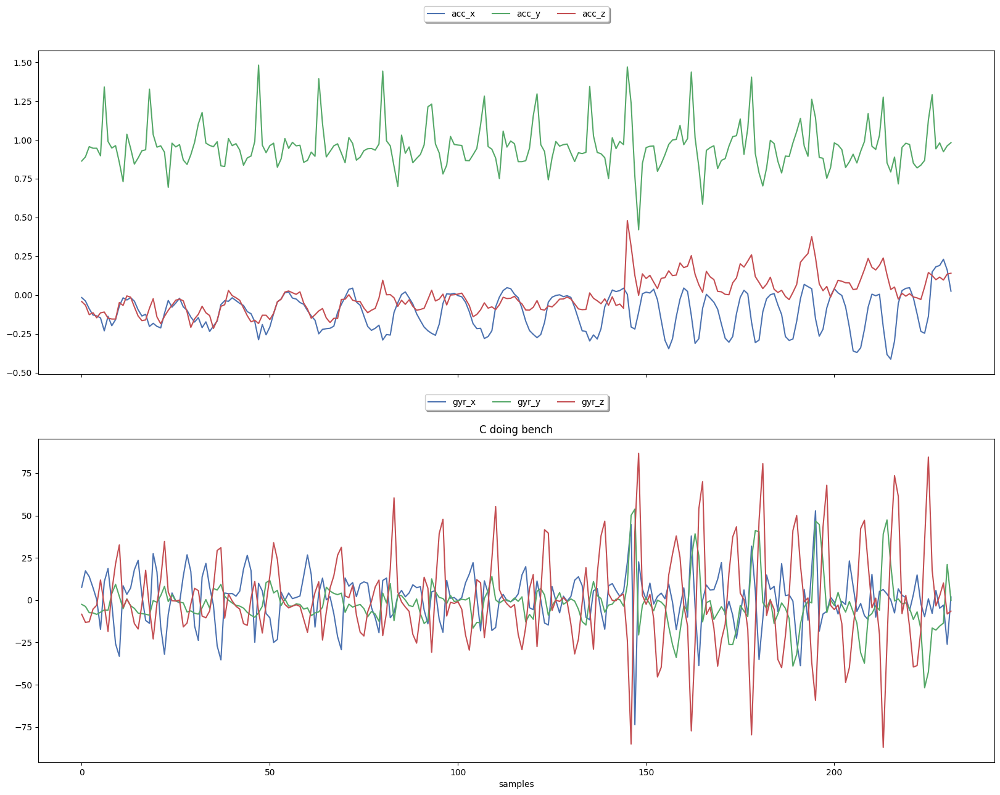

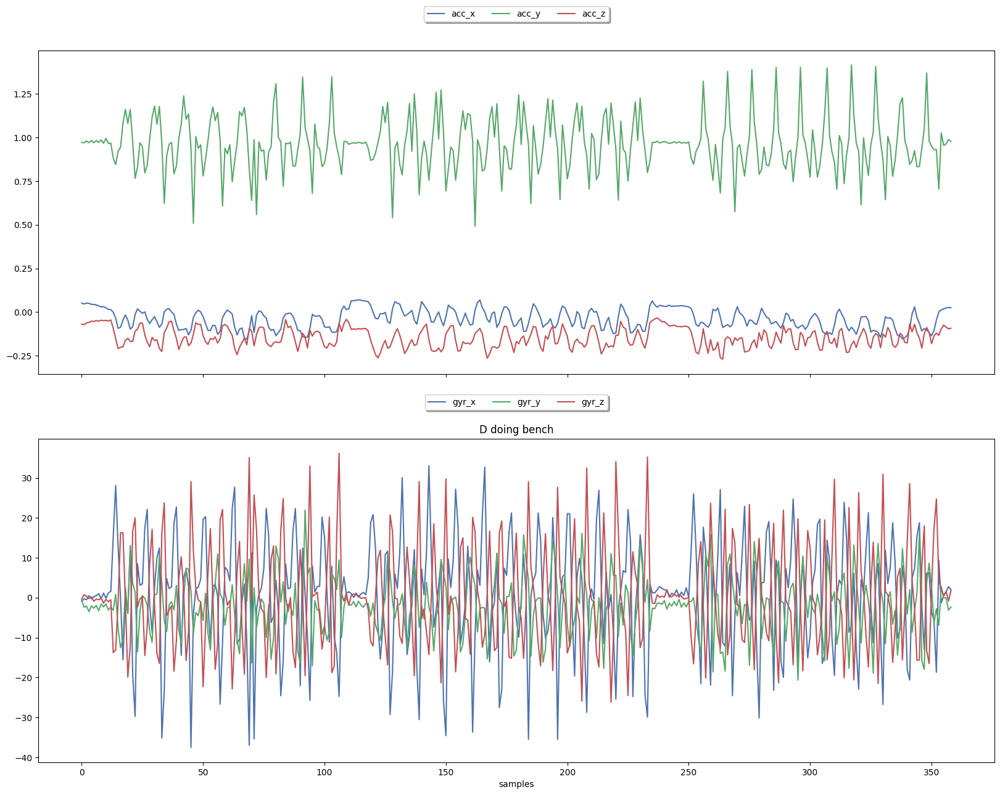

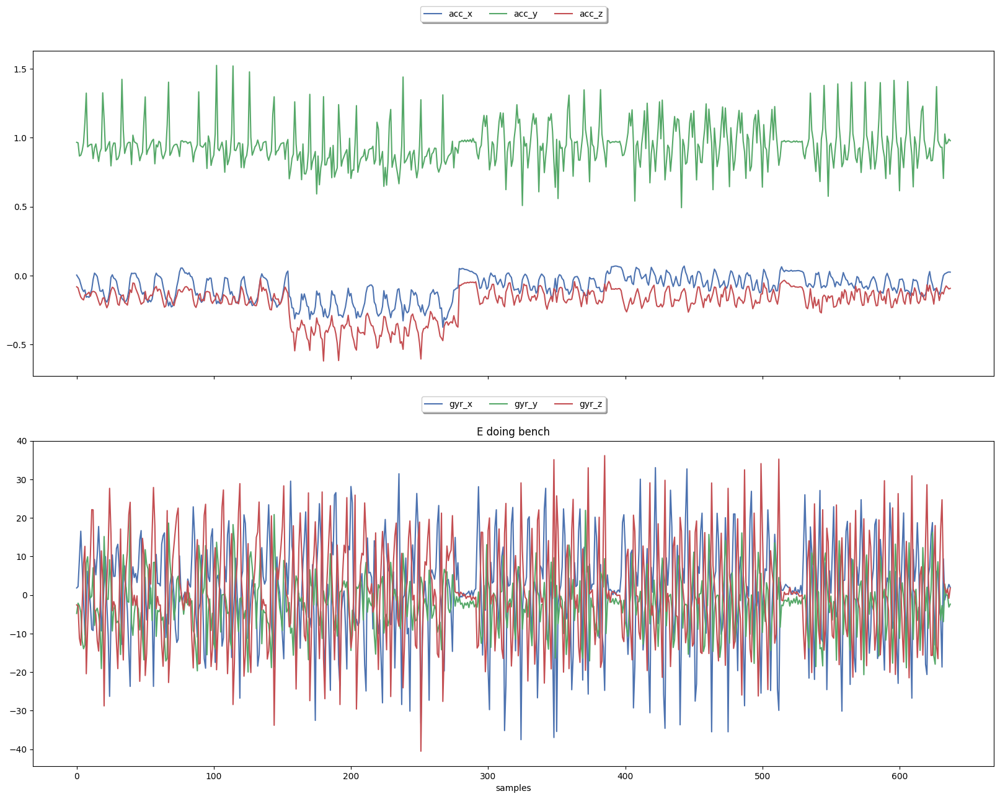

...

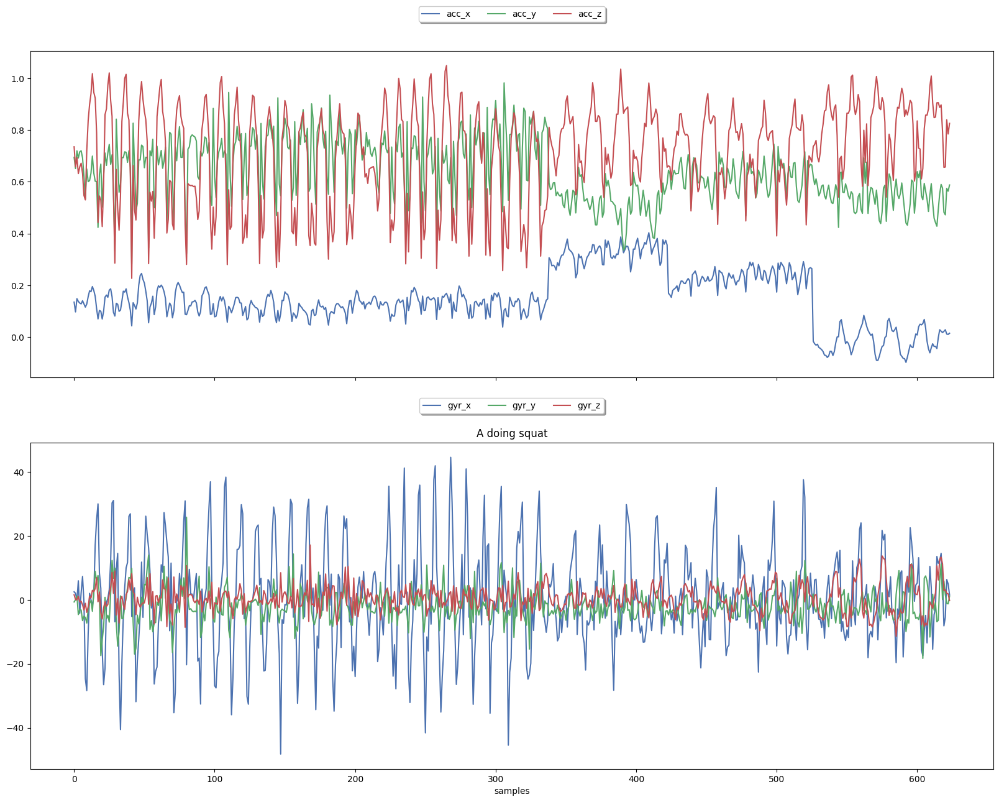

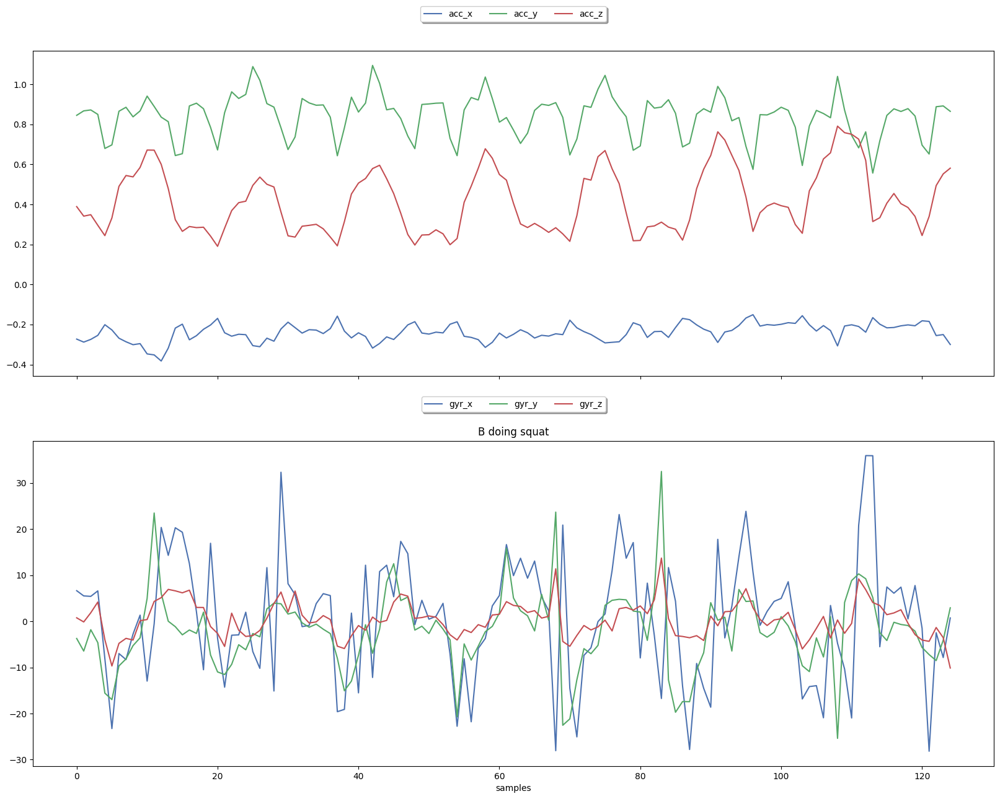

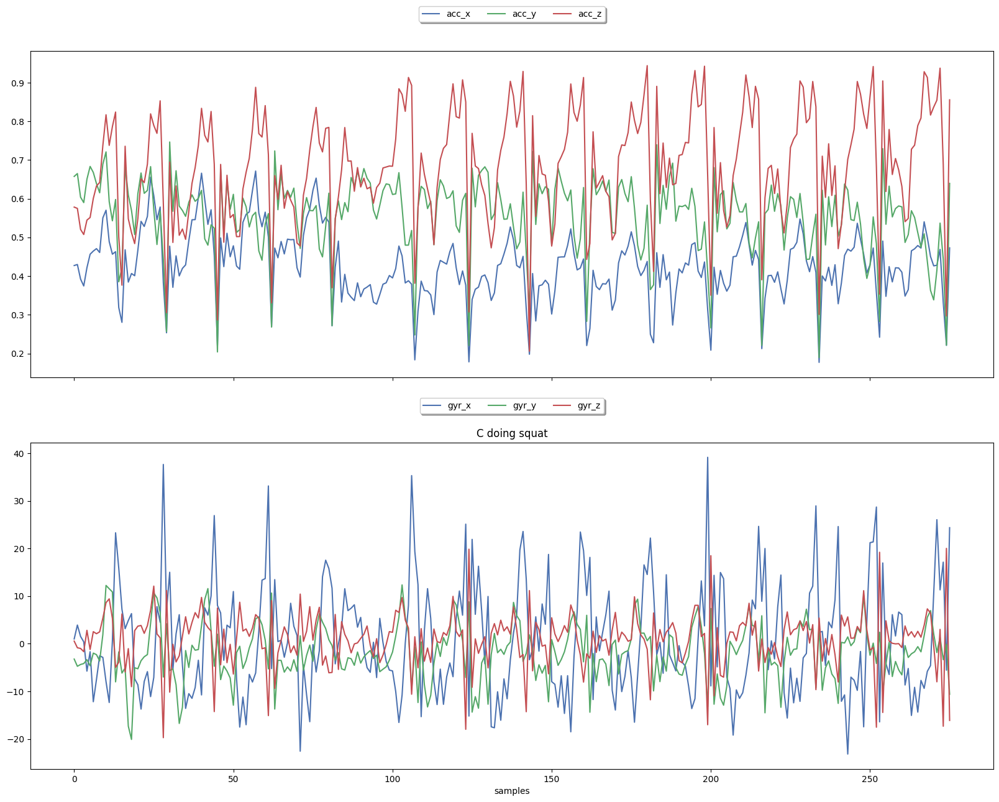

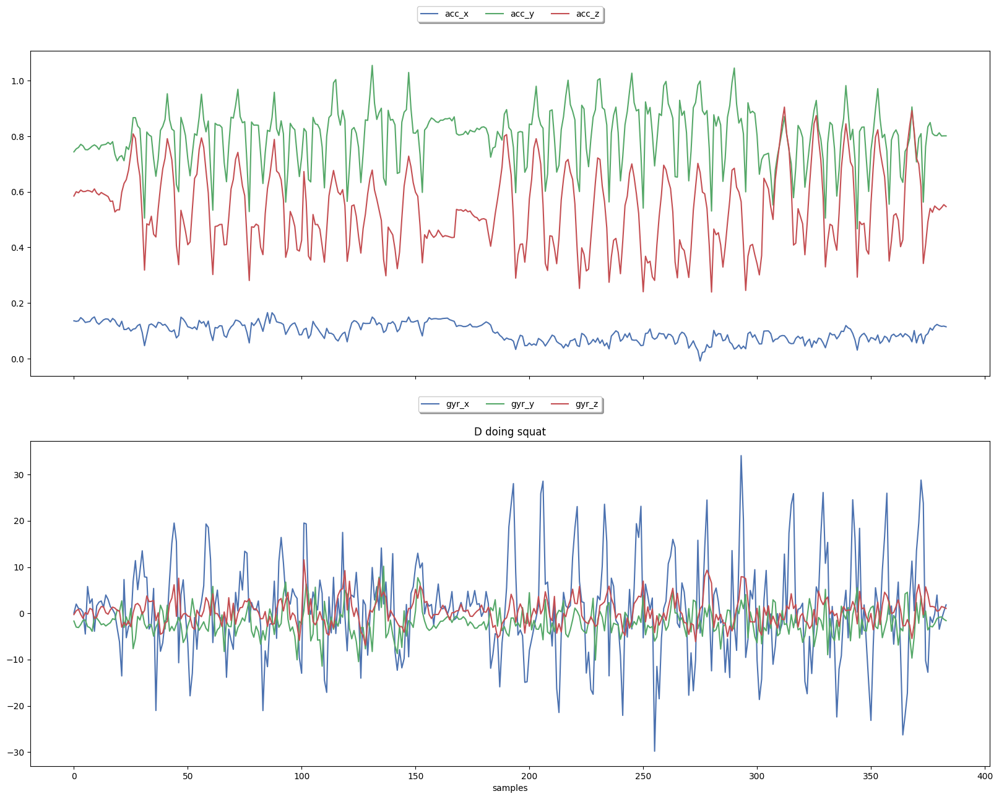

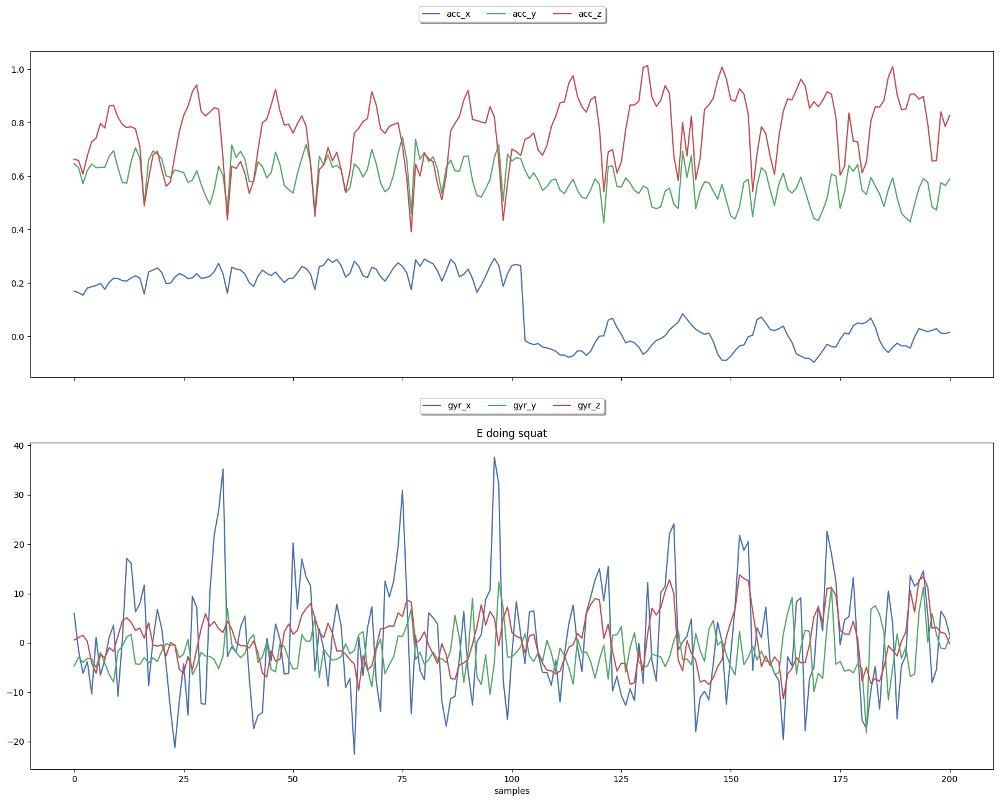

In [17]:
labels = df['label'].unique()
labels = sorted(labels)
participtants = df['participtant'].unique()
participtants = sorted(participtants)

for label in labels :
    for participtant in participtants:

        combined_plot_df = (
            df.query(f"label == '{label}'").
            query(f"participtant == '{participtant}'").
            reset_index()
        )

        if(len(combined_plot_df) > 0):

            fig, ax = plt.subplots(nrows = 2, sharex = True, figsize = (20, 15))
            combined_plot_df[["acc_x", "acc_y", "acc_z"]].plot(ax = ax[0])
            combined_plot_df[['gyr_x', 'gyr_y', 'gyr_z']].plot(ax = ax[1])

            ax[0].legend(
                loc = "upper center", bbox_to_anchor = (0.5, 1.15), ncol= 3, fancybox = True, shadow = True
            )
            ax[1].legend(
                loc = "upper center", bbox_to_anchor = (0.5, 1.15), ncol= 3, fancybox = True, shadow = True
            )
            ax[1].set_xlabel('samples')
            plt.title(f"{participtant} doing {label}")

            plt.savefig(f'../../reports/figures/{label.title()} ({participtant}).png')


            plt.show()